# <p style = "text-align: center;"> Домашнее задание №3 </p>
### <p style = "text-align: center;"> *Гвоздков Иван, БСЦ214* </p>

#### Подготовка к выполнению задания, импорт пакетов, сиды, вывод таблиц

In [358]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import time
import seaborn as sns
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

pd.set_option("display.max_columns", None)

random.seed(42)
np.random.seed(42)

# Кроме прочего, нужно разрешить выводить таблицей все столбцы (это пригодится в конце)

#### Загрузка данных и вывод первых строк и случайных строк

In [359]:
# Загрузка данных из файла csv c помощью read_csv

data_start = pd.read_csv("data.adult.csv")

# Размерность данных
print("Размерность данных:", data_start.shape)

Размерность данных: (16280, 14)


In [360]:
# Несколько верхних строк таблицы, выведенные с помощью head

data_start.head(10)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,">50K,<=50K"
0,34,Local-gov,284843,HS-grad,9,Never-married,Farming-fishing,Not-in-family,Black,Male,594,0,60,<=50K
1,40,Private,190290,Some-college,10,Divorced,Sales,Not-in-family,White,Male,0,0,40,<=50K
2,36,Local-gov,177858,Bachelors,13,Married-civ-spouse,Prof-specialty,Own-child,White,Male,0,0,40,<=50K
3,22,Private,184756,Some-college,10,Never-married,Sales,Own-child,White,Female,0,0,30,<=50K
4,47,Private,149700,Bachelors,13,Married-civ-spouse,Tech-support,Husband,White,Male,15024,0,40,>50K
5,18,Private,446771,Some-college,10,Never-married,Adm-clerical,Own-child,White,Male,0,0,25,<=50K
6,31,Federal-gov,108464,Assoc-acdm,12,Married-civ-spouse,Tech-support,Husband,White,Male,0,0,40,<=50K
7,18,?,423460,11th,7,Never-married,?,Own-child,White,Male,0,0,36,<=50K
8,25,Private,110138,HS-grad,9,Never-married,Other-service,Not-in-family,White,Male,0,0,40,<=50K
9,53,Federal-gov,167410,Bachelors,13,Divorced,Tech-support,Not-in-family,Amer-Indian-Eskimo,Male,0,0,40,<=50K


In [361]:
# Несколько случайных строк таблицы, выведенные с помощью sample

data_start.sample(10)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,">50K,<=50K"
13633,40,State-gov,345969,Assoc-acdm,12,Married-civ-spouse,Adm-clerical,Husband,White,Male,0,0,40,>50K
1921,27,Private,131679,Assoc-voc,11,Divorced,Sales,Not-in-family,White,Female,0,0,40,<=50K
12140,38,Private,144860,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,65,<=50K
9933,35,Self-emp-not-inc,89508,Some-college,10,Married-civ-spouse,Exec-managerial,Husband,White,Male,3908,0,60,<=50K
7745,72,?,237229,Assoc-voc,11,Widowed,?,Not-in-family,White,Female,0,0,30,<=50K
13499,34,Private,379798,Masters,14,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,40,>50K
5046,43,Private,187728,Some-college,10,Married-civ-spouse,Prof-specialty,Wife,White,Female,0,1887,50,>50K
10062,46,Private,35969,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,51,<=50K
8612,18,Private,127273,11th,7,Never-married,Other-service,Other-relative,White,Male,0,0,20,<=50K
14439,70,Private,141742,Assoc-voc,11,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,9386,0,50,>50K


# Задание №1, 1 балл

#### Удаление строк с пропущенными значениями

In [362]:
# Сначала с помощью метода replace нужно перекодировать все пропущенные значения в действительно пропущенные значения
# На данный момент все пропуски обозначены, как вопросительные знаки, а нужно, чтобы это были пропуски, то есть, None

data_start = data_start.replace("?", None)

In [363]:
# Теперь с помощью метода dropna можно почистить данные от строк с пропущенными значениями

data = data_start.dropna()

# А также - восстановить нумерацию
data = data.reset_index(drop = True)

# Размерность данных без пропусков (проверить, что строк стало меньше, то есть, строки с пропусками удалились)
print("Размерность данных:", data.shape)

Размерность данных: (15347, 14)


#### Предобработка данных, зависимая переменная

In [364]:
# Cначала нужно вынести целевую переменную в отдельный набор данных, перекодировать и удалить из изначального набора данных
# Нужно так же переименовать единственный столбец в наборе данных с зависимой переменной (для кайфа)

great_earnings = data.loc[:, [">50K,<=50K"]]
great_earnings = great_earnings.rename(columns = {">50K,<=50K": "Great earnings"})

# Теперь внутри этой переменной с помощью метода map заменим значения на нули и единицы
# Будем считать нулём заработок менее 50К, а единицей, соответственно, более

great_earnings["Great earnings"] = great_earnings["Great earnings"].map({">50K": 1, "<=50K": 0})

In [365]:
# Можно вывести 10 случайных строк нового набора данных с зависимой переменных, чтобы проверить, что всё корректно
 
great_earnings.sample(10)

,Great earnings
15111,0
6695,0
336,1
12097,0
1278,0
13456,1
12711,0
780,1
13090,1
8545,0


In [366]:
# И в конце - удалить теперь лишний столбец с зависимой переменной из изначального набора данных с помощью drop

data = data.drop(columns = [">50K,<=50K"])

# Размерность данных без зависимой переменной (нужно проверить, что столбцов стало на один меньше)
print("Размерность данных:", data.shape)

Размерность данных: (15347, 13)


# Задание №2, 2 балла

#### Предобработка данных, вещественные независимые переменные

In [367]:
# Поскольку изначально будет происходить обучение моделей на вещественных признаках, нужно вынести их в отдельный набор данных
# Нужно узнать, какие признаки можно считать вещественными, для этого нужно вывести инфомрацию о наборе данных


data.info()

# Можно увидеть, что в наборе данных из 13 независимых переменных 6 - это вещественные, а именно:
# age, fnlwgt, education-num, capital-gain, capital-loss, hours-per-week

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15347 entries, 0 to 15346
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             15347 non-null  int64 
 1   workclass       15347 non-null  object
 2   fnlwgt          15347 non-null  int64 
 3   education       15347 non-null  object
 4   education-num   15347 non-null  int64 
 5   marital-status  15347 non-null  object
 6   occupation      15347 non-null  object
 7   relationship    15347 non-null  object
 8   race            15347 non-null  object
 9   sex             15347 non-null  object
 10  capital-gain    15347 non-null  int64 
 11  capital-loss    15347 non-null  int64 
 12  hours-per-week  15347 non-null  int64 
dtypes: int64(6), object(7)
memory usage: 1.5+ MB


In [368]:
# Нужные столбцы с вещественными признаками теперь можно убрать в отдельный набор данных

real_var = data.loc[:, ["age", "fnlwgt", "education-num", "capital-gain", "capital-loss", "hours-per-week"]]

# Можно вывести 10 случайных строк нового набора данных с независимыми переменными, чтобы проверить, что всё корректно
real_var.sample(10)

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
6617,25,458549,2,0,0,96
1151,39,347434,5,0,0,43
1642,23,250630,13,0,0,40
4001,39,114591,10,0,0,40
14499,50,71417,9,3103,0,40
286,35,289106,12,0,0,40
7512,42,248356,9,0,0,40
1267,33,60567,9,3411,0,40
3766,47,329205,13,0,0,40
7836,39,114544,13,0,0,45


#### Разбиение на тренировочную и тестовую выборки; гиперпараметр

In [369]:
# С помощью train_test_split разобъём данные сначала на 60% тренировочной выборки и 40% остальной
# Оставшиеся 40% разобъём пополам на тестовую и валидационную выборки

x_train, x, y_train, y = train_test_split(real_var, great_earnings, test_size = 0.4, random_state = 42)
x_val, x_test, y_val, y_test = train_test_split(x, y, test_size = 0.5, random_state = 42)

# Так же создадим одномерные массивы (они пригодятся) из зависимой переменной
y_train_1d = y_train.values.ravel()
y_val_1d = y_val.values.ravel()
y_test_1d = y_test.values.ravel()

In [370]:
# Зададим область сетки гиперпараметра, которая будет использоваться при дальнейшем поиске по сетке
# Рассмотрим значения max_depth от 1 до 20 с шагом в единицу, то есть, 20 значений

param_grid = {"max_depth": np.arange(1, 20, 1)}

#### Поиск по сетке, DecisonTree

In [371]:
# Создание модели
# Стоит задача разделения на два класса, так что, разумеется, используем классификатор, а не регрессор 
# Поскольку задачу классификации решает не регрессия, а классификация, что логично

modelDTC = DecisionTreeClassifier(random_state = 42)

In [372]:
# Для поиска по сетке с тремя выборками, сначала сохраним в переменные "Лучшая метрика" и "Лучший параметр" нули
# Затем запустим цикл для каждого значения гиперпараметра, которые были поданы выше в param_grid
# Будет происходить оценка на валидационной выборке. Лучшие результаты будут сохранены в заранее созданные переменные

best_roc_auc1 = 0
best_params1 = 0

for max_depth1 in param_grid["max_depth"]:
    modelDTC.set_params(max_depth = max_depth1)
    modelDTC.fit(x_train, y_train)
    
    y_val_prob1 = modelDTC.predict_proba(x_val)[:, 1]
    roc_auc1 = roc_auc_score(y_val, y_val_prob1)
    
    if roc_auc1 > best_roc_auc1:
        best_roc_auc1 = roc_auc1
        best_params1 = max_depth1

In [373]:
# Теперь, когда модель прошлась по сетке и нашла лучшее значение max_depth, можно увидеть, насколько это хорошее значение

print("Лучшее найденное значение max_depth:", best_params1)
print("Лучший ROC-AUC на валидационной выборке:", best_roc_auc1)

# Лучшее значение max_depth = 6, возвращает ~82% точности с точки зрения ROC-AUC

Лучшее найденное значение max_depth: 6
Лучший ROC-AUC на валидационной выборке: 0.823144804938979


In [374]:
# Теперь можно создать модель с подобрнным, лучшим гиперпараметром

best_model1 = DecisionTreeClassifier(max_depth = best_params1, random_state = 42)

In [375]:
# И обучить эту модель на тренировочной и валидационной выборе

best_model1.fit(pd.concat([x_train, x_val]), pd.concat([y_train, y_val]))

DecisionTreeClassifier(max_depth=np.int64(6), random_state=42)

In [376]:
# Предсказание классификации (первый класс) зависимой переменной на тестовой выборке

y_prob1 = best_model1.predict_proba(x_test)[:, 1]

In [377]:
# Метрика ROC-AUC 

print(f'ROC-AUC = {roc_auc_score(y_test, y_prob1)}')

ROC-AUC = 0.8334317833607147


#### Поиск по сетке, RandomForest

In [378]:
# Создание модели
# Стоит задача разделения на два класса, так что, разумеется, используем классификатор, а не регрессор 
# Поскольку задачу классификации решает не регрессия, а классификация, что логично

modelRF = RandomForestClassifier(random_state = 42)

In [379]:
# Для поиска по сетке с тремя выборками, сначала сохраним в переменные "Лучшая метрика" и "Лучший параметр" нули
# Затем запустим цикл для каждого значения гиперпараметра, которые были поданы выше в param_grid
# Будет происходить оценка на валидационной выборке. Лучшие результаты будут сохранены в заранее созданные переменные
# Так же, везде, где в обучении участвует зависимая переменная используем values.ravel, чтобы она читалась, как одномерный массив

best_roc_auc2 = 0
best_params2 = 0

for max_depth2 in param_grid["max_depth"]:
    modelRF.set_params(max_depth = max_depth2)
    modelRF.fit(x_train, y_train_1d)
    
    y_val_prob2 = modelRF.predict_proba(x_val)[:, 1]
    roc_auc2 = roc_auc_score(y_val, y_val_prob2)
    
    if roc_auc2 > best_roc_auc2:
        best_roc_auc2 = roc_auc2
        best_params2 = max_depth2

In [380]:
# Теперь, когда модель прошлась по сетке и нашла лучшее значение max_depth, можно увидеть, насколько это хорошее значение

print("Лучшее найденное значение max_depth:", best_params2)
print("Лучший ROC-AUC на валидационной выборке:", best_roc_auc2)

# Лучшее значение max_depth = 9, возвращает ~84% точности с точки зрения ROC-AUC

Лучшее найденное значение max_depth: 9
Лучший ROC-AUC на валидационной выборке: 0.844607337284994


In [381]:
# Теперь можно создать модель с подобрнным, лучшим гиперпараметром

best_model2 = RandomForestClassifier(max_depth = best_params2, random_state = 42)

In [382]:
# И обучить эту модель на тренировочной и валидационной выборе

best_model2.fit(pd.concat([x_train, x_val]), np.concatenate((y_train_1d, y_val_1d)))

RandomForestClassifier(max_depth=np.int64(9), random_state=42)

In [383]:
# Предсказание классификации (первый класс) зависимой переменной на тестовой выборке

y_prob2 = best_model2.predict_proba(x_test)[:, 1]

In [384]:
# Метрика ROC-AUC 

print(f'ROC-AUC = {roc_auc_score(y_test, y_prob2)}')

ROC-AUC = 0.8489468923633543


#### Поиск по сетке, GradientBoosting

In [385]:
# Создание модели
# Стоит задача разделения на два класса, так что, разумеется, используем классификатор, а не регрессор 
# Поскольку задачу классификации решает не регрессия, а классификация, что логично

modelGB = GradientBoostingClassifier(random_state = 42)

In [386]:
# Для поиска по сетке с тремя выборками, сначала сохраним в переменные "Лучшая метрика" и "Лучший параметр" нули
# Затем запустим цикл для каждого значения гиперпараметра, которые были поданы выше в param_grid
# Будет происходить оценка на валидационной выборке. Лучшие результаты будут сохранены в заранее созданные переменные
# Так же, везде, где в обучении участвует зависимая переменная используем values.ravel, чтобы она читалась, как одномерный массив

best_roc_auc3 = 0
best_params3 = 0

for max_depth3 in param_grid["max_depth"]:
    modelGB.set_params(max_depth = max_depth3)
    modelGB.fit(x_train, y_train.values.ravel())
    
    y_val_prob3 = modelGB.predict_proba(x_val)[:, 1]
    roc_auc3 = roc_auc_score(y_val, y_val_prob3)
    
    if roc_auc3 > best_roc_auc3:
        best_roc_auc3 = roc_auc3
        best_params3 = max_depth3

In [387]:
# Теперь, когда модель прошлась по сетке и нашла лучшее значение max_depth, можно увидеть, насколько это хорошее значение

print("Лучшее найденное значение max_depth:", best_params3)
print("Лучший ROC-AUC на валидационной выборке:", best_roc_auc3)

# Лучшее значение max_depth = 6, возвращает ~86% точности с точки зрения ROC-AUC

Лучшее найденное значение max_depth: 6
Лучший ROC-AUC на валидационной выборке: 0.8583560725446128


In [388]:
# Теперь можно создать модель с подобрнным, лучшим гиперпараметром

best_model3 = GradientBoostingClassifier(max_depth = best_params3, random_state = 42)

In [389]:
# И обучить эту модель на тренировочной и валидационной выборе

best_model3.fit(pd.concat([x_train, x_val]), np.concatenate((y_train_1d, y_val_1d)))

GradientBoostingClassifier(max_depth=np.int64(6), random_state=42)

In [390]:
# Предсказание классификации (первый класс) зависимой переменной на тестовой выборке

y_prob3 = best_model3.predict_proba(x_test)[:, 1]

In [391]:
# Метрика ROC-AUC 

print(f'ROC-AUC = {roc_auc_score(y_test, y_prob3)}')

ROC-AUC = 0.8629494509453162


In [392]:
# Общий вывод:

# Все три модели возвращают довольно высокое качество. При этом! На тестовой выборке во всех трёх моделях качество выше!
# Имеется в виду, выше, чем при поборе гиперпараметров. Это клёво. 
# Касательно качества: Градиентный бустинг > Рандомный лес > Дерево решений. 
# Во время валидации - примерно 85,84%, 84,46% и 82,31%, (Метрика ROC-AUC).
# Гиперпараметр max_depth соответственно: 6, 9, 6.
# При этом, стоит сказать, что градиентный бустинг работает существенно дольше, чем два других метода
# Поэтому, выбор итоговой модели зависит от того, что важнее - качество или время.
# Если качество, то нужно выбирать градиентный бустинг, но если время - то рандомный лес.

# На тестовой выборке качество моделей улучшается примерно на половину процентного пункта:
# Градиентный бустинг > Рандомный лес > Дерево решений. 
# На тренировочной выборке - примерно 86,29%, 84,89% и 83,34% (Метрика ROC-AUC).

# Задание №3, 1 балл

#### Подбор оптимального количества деревьев случайного леса

In [393]:
# Для подбора нужного количества деревьев в рандомном лесу можно использовать кросс валидацию
# Это более точный и корректный метод для подбора данного параметра, поскольку он избавляет от самостоятельного разбиения
# Самостоятельное разбиение может быть не очень корректно, в то время как набор случайных фолдов даст более репрезентативный результат
# Сначала просто забьём в x и y переменные - вещественные независимые переменные и зависимую, как одномерный массив

x = real_var
y = great_earnings.values.ravel()

In [394]:
# Хотелось изначально рассмотреть 1000 деревьев. Код работал 4 часа, сделал чуть более половины, после этого я его остановил
# Посему, поскольку нет особой заинтересованности в высочайшей точности модели, рандомный лес имеет 100 деревьев

max_trees_RF = 100

In [395]:
# Создание модели. Кроме прочего, для лучшей работы (это я нагуглил) подадим в модель параметр n_jobs = -1
# Это означает, что процессу будет дан высший приоритет и использоваться будут все ядра системы (как я понял)

modelRF_optimum_tree = RandomForestClassifier(n_estimators = max_trees_RF, random_state = 42, n_jobs = -1)

In [396]:
# Обучение модели

modelRF_optimum_tree.fit(x, y)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [397]:
# Нужно создать пустой список roc_auc, в который будут возвращаться значения соответствующей метрики
# А так же перебрать возможные количества деревьев - подмножества, от 1 до 100 с шагом 1 (99 штук)

grid_trees = np.arange(1, max_trees_RF, 1)
 
roc_auc = []

In [398]:
# Теперь нужно пройтись по всем заданным подмножествам и оценить качество модели в зависимости от количества деревьев
# cv = 5

for n_trees in grid_trees:
    normal_trees = RandomForestClassifier(n_estimators = n_trees, random_state = 42, n_jobs = -1)
    normal_trees.estimators_ = modelRF_optimum_tree.estimators_[:n_trees]

    scores = cross_val_score(normal_trees, x, y, cv = 5, scoring = "roc_auc")
    roc_auc.append(scores.mean())

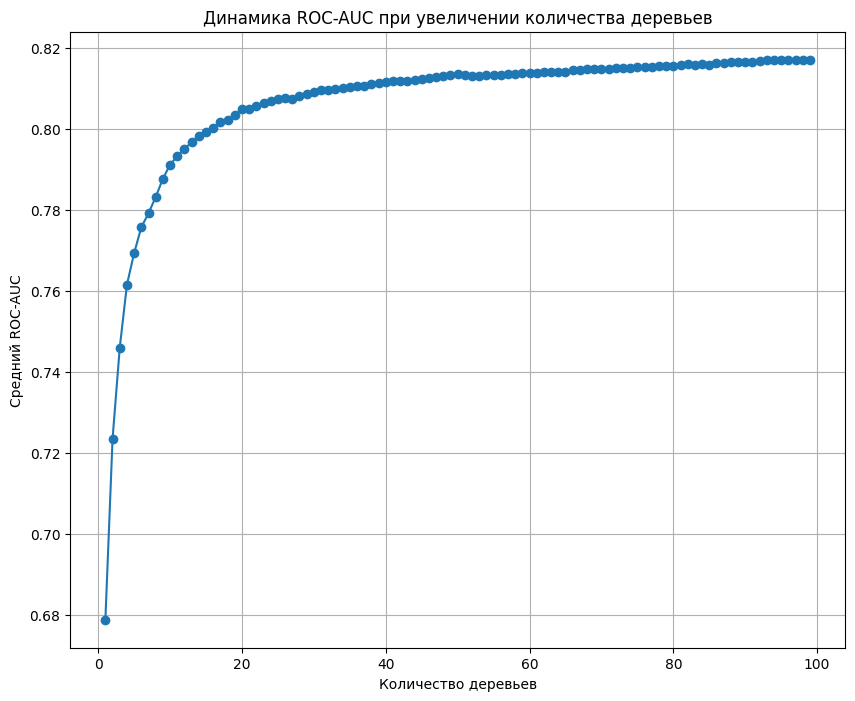

In [399]:
# График, который выводит зависимость между значением ROC-AUC и количеством деревьев в модели

plt.figure(figsize = (10, 8))
plt.plot(grid_trees, roc_auc, marker = "o")
plt.xlabel("Количество деревьев")
plt.ylabel("Средний ROC-AUC")
plt.title("Динамика ROC-AUC при увеличении количества деревьев")
plt.grid()
plt.show()

In [400]:
# Будем считать, что качество стабильно, когда изменение ROC-AUC не превышает 0,0001
# Тогда, алгоритм поиска оптимального количества деревьев ниже

optimal_trees = 0

for i in np.arange(1, len(roc_auc)):
    if abs(roc_auc[i] - roc_auc[i - 1]) <= 0.0001:
        optimal_trees = grid_trees[i]
        break

print("Оптимальное количество деревьев в рандомном лесу =", optimal_trees)
print("Среднее значение AUC-ROC =", sum(roc_auc)/len(roc_auc))

Оптимальное количество деревьев в рандомном лесу = 27
Среднее значение AUC-ROC = 0.8064547551446857


# Задание №4, 1 балл

#### Подбор оптимального количества деревьев градиентного бустинга

In [401]:
# Поскольку обучение проходит не через кросс валидацию, а с помощью разбиения изначальной выборки
# Имеет смысл увеличить количество деревьев

max_trees_GB = 500

# Так же, нужно "срастить" тренировочную и валидационную выборки. В данном задании имеет смысл использовать "простое" разбиение
# То есть, разбиение на тренировочную и тестовую выборку 

x_extra_train = pd.concat([x_train, x_val])
y_extra_train = np.concatenate((y_train_1d, y_val_1d))

In [402]:
# Нужно создать пустые списки, в которые будут возвращаться значения ошибок на тренировочной и тестовой выборках
# А так же перебрать возможные количества деревьев - подмножества, от 1 до 500 с шагом 1 (499 штук)

grid_trees_GB = np.arange(1, max_trees_GB, 1)

train_errors = []
test_errors = []

In [403]:
# Нужно создать модель и посмотреть на то, какие ошибки она будет возвращать на тренировочной и тестовой выборках
# Исходя из полученных данных, можно будет вывести оптимальное количество деревьев и минимальное значение ошибки, соответственно
# Обучение модели проходит на тренировочной выборке

for n_trees_GB in grid_trees_GB:
    modelGB_optimum_tree = GradientBoostingClassifier(n_estimators = n_trees_GB, random_state = 42)
    modelGB_optimum_tree.fit(x_extra_train, y_extra_train)
    
# Поиск ошибки для тренировочной выборки    
    y_train_prob_GB = modelGB_optimum_tree.predict_proba(x_extra_train)
    train_error = log_loss(y_extra_train, y_train_prob_GB)
    train_errors.append(train_error)

# И для тестовой выборки, соответственно
    y_test_prob_GB = modelGB_optimum_tree.predict_proba(x_test)
    test_error = log_loss(y_test, y_test_prob_GB)
    test_errors.append(test_error)

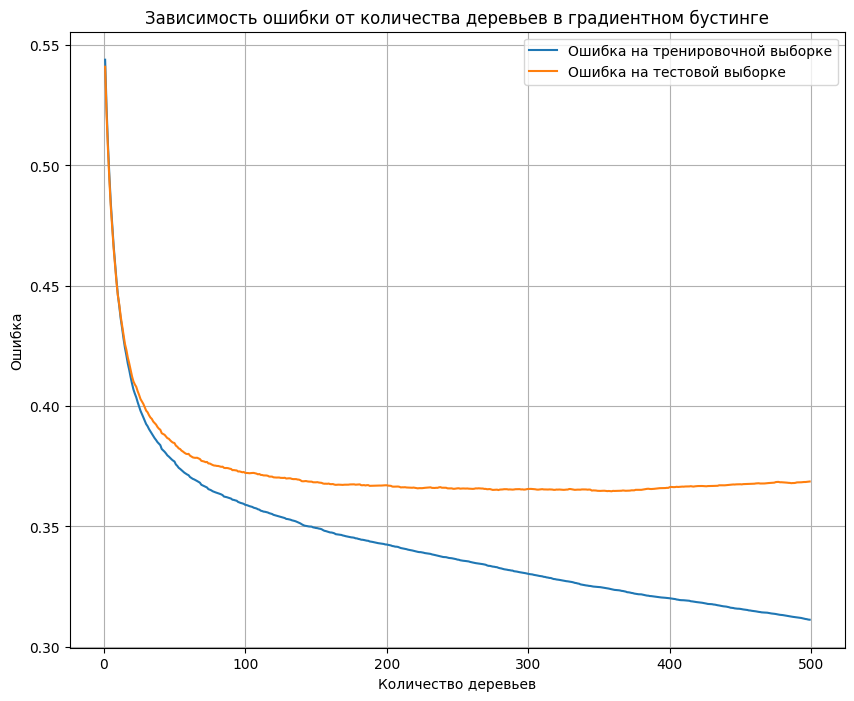

In [404]:
# Построение графика градиентного спуска на тренировочной и тестовой выборках

plt.figure(figsize = (10, 8))
plt.plot(grid_trees_GB, train_errors, label = "Ошибка на тренировочной выборке")
plt.plot(grid_trees_GB, test_errors, label = "Ошибка на тестовой выборке")
plt.xlabel("Количество деревьев")
plt.ylabel("Ошибка")
plt.title("Зависимость ошибки от количества деревьев в градиентном бустинге")
plt.legend()
plt.grid(True)
plt.show()

# Кривая ошибки не совсем U-образна (в явном виде), но имеет тенденцию к росту после падения (на тестовых данных)

In [405]:
# Нахождение оптимального количества деревьев и минимальной ошибки, соответственно

optimal_trees_GB = grid_trees_GB[np.argmin(test_errors)]
min_val_error = min(test_errors)

In [406]:
# Итоговые метрики

print("Оптимальное количество деревьев =", optimal_trees_GB)
print("Минимальная ошибка на тестовой выборке =", min_val_error)

Оптимальное количество деревьев = 359
Минимальная ошибка на тестовой выборке = 0.3645871913646632


#### RandomForest, оптимальная модель

In [407]:
# Построение и обучение модели с найденными параметрами

finalRF = RandomForestClassifier(n_estimators = 27, max_depth = 9, random_state = 42)
finalRF.fit(x_extra_train, y_extra_train)

RandomForestClassifier(max_depth=9, n_estimators=27, random_state=42)

In [408]:
# Оценка модели на тестовой выборке

y_test_prob_finalRF = finalRF.predict_proba(x_test)[:, 1]  
test_roc_auc_finalRF = roc_auc_score(y_test, y_test_prob_finalRF)
print("ROC-AUC на валидационной выборке =", test_roc_auc_finalRF)

ROC-AUC на валидационной выборке = 0.8488380938955948


#### GradientBoosting, оптимальная модель

In [409]:
# Построение и обучение модели с найденными параметрами

finalGB = GradientBoostingClassifier(n_estimators = 359, max_depth = 6, random_state = 42)
finalGB.fit(x_extra_train, y_extra_train)

GradientBoostingClassifier(max_depth=6, n_estimators=359, random_state=42)

In [410]:
# Оценка модели на тестовой выборке

y_test_prob_finalGB = finalGB.predict_proba(x_test)[:, 1]  
test_roc_auc_finalGB = roc_auc_score(y_test, y_test_prob_finalGB)
print("ROC-AUC на валидационной выборке =", test_roc_auc_finalGB)

ROC-AUC на валидационной выборке = 0.8486574157203437


# Задание №5, 1 балл

#### Гистограмма, age

C:\Users\Светлая Личность\AppData\Local\Temp\ipykernel_12648\3683112900.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(real_var["age"], kde = True, bins = 70, palette = "viridis")


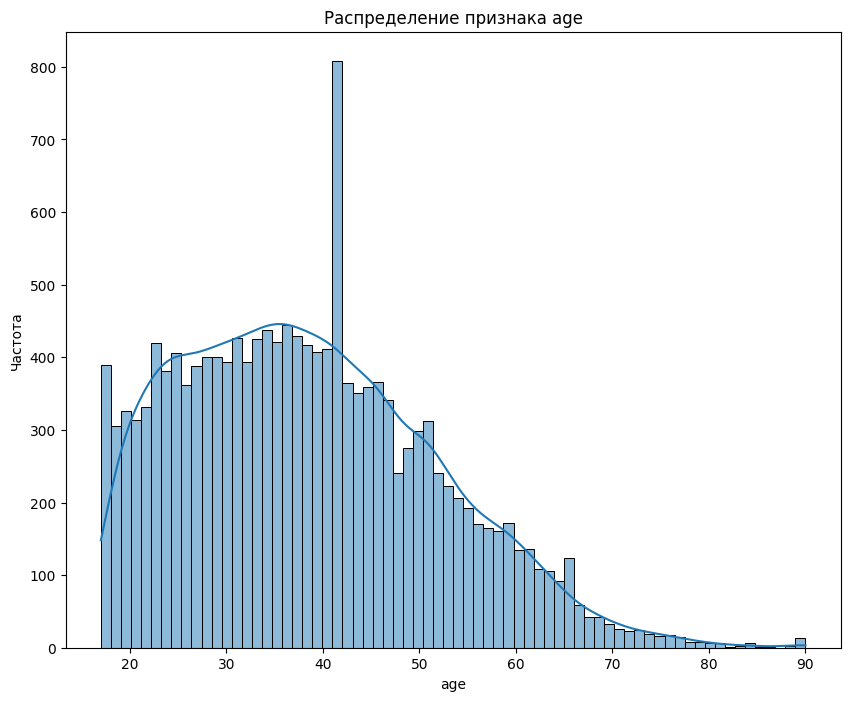

In [411]:
# Опять же, не очень понятно, что описывать при построении диаграмм
# bins = 70, чтобы каждый год был отдельно

plt.figure(figsize = (10, 8))
sns.histplot(real_var["age"], kde = True, bins = 70, palette = "viridis")
plt.title("Распределение признака age")
plt.xlabel("age")
plt.ylabel("Частота")
plt.show()

#### Гистограмма, fnlwgt

C:\Users\Светлая Личность\AppData\Local\Temp\ipykernel_12648\3041529879.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(real_var["fnlwgt"], kde = True, bins = 120, palette = "viridis")


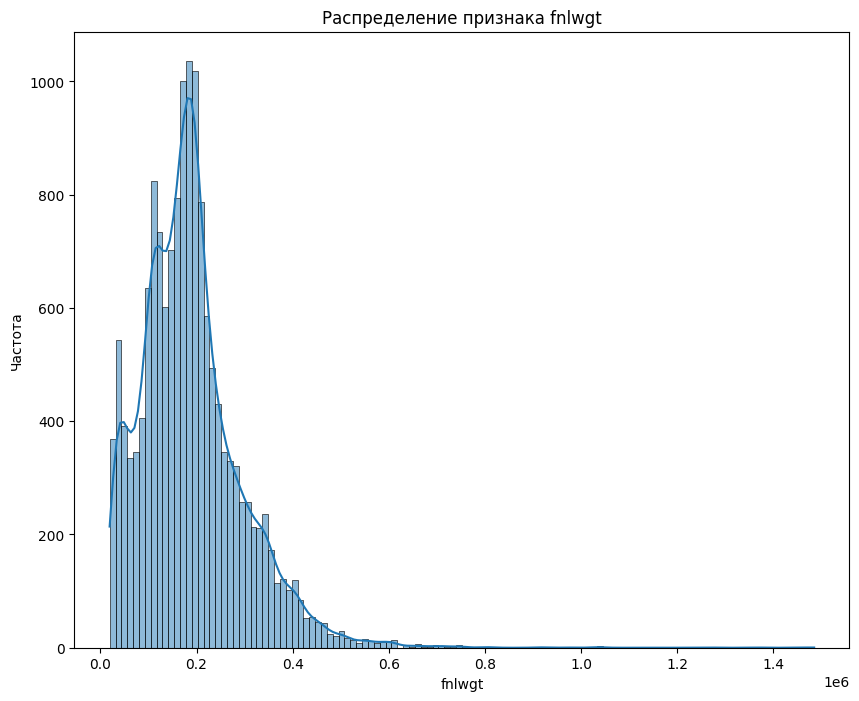

In [412]:
# Приятного аппетита всем, кто сейчас ест
# bins = 120, подходит под ОДЗ переменной и распределениие, чтобы примерно каждое существенно значение обозначалось отдельно

plt.figure(figsize = (10, 8))
sns.histplot(real_var["fnlwgt"], kde = True, bins = 120, palette = "viridis")
plt.title("Распределение признака fnlwgt")
plt.xlabel("fnlwgt")
plt.ylabel("Частота")
plt.show()

#### Гистограмма, capital-gain

C:\Users\Светлая Личность\AppData\Local\Temp\ipykernel_12648\175218188.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(real_var["capital-gain"], kde = True, bins = 200, palette = "viridis")


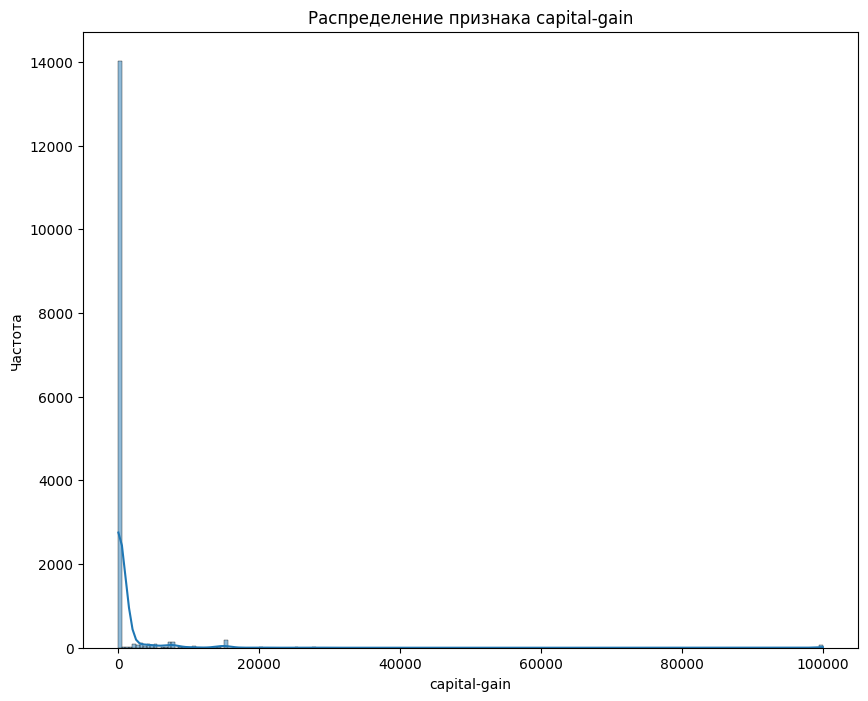

In [413]:
# Всем, кто ложится спать, спокойного сна
# bins = 200, но это не имеет особого смысла, почти все наблюдения всё равно находятся в одном значении

plt.figure(figsize = (10, 8))
sns.histplot(real_var["capital-gain"], kde = True, bins = 200, palette = "viridis")
plt.title("Распределение признака capital-gain")
plt.xlabel("capital-gain")
plt.ylabel("Частота")
plt.show()

In [414]:
# Общий вывод:

# Данные (особенно 2 и 3 переменные) сильно смещены влево, имеют большое количество одиновых значений, то есть
# Проблема разобщённости данных
# Возраст - самая нормальная в этом плане переменная, но всё равно со смещением влево
# Подобная нестабильность в данных может влиять на классификацию, но масштабирование вряд ли решит эту проблему
# Поскольку, даже если масштабировать смещённую переменную, в которой почти все значения одинаковые, то изменится...
# ...лишь абсолютное значение, но по сути, это всё так же будет переменная, в которой много одинаковых данных

# Задание №6, 2 балла

#### Масштабирование данных

In [415]:
# Нужно использовать стандартизатор StandardScaler

normalizer = StandardScaler()

In [416]:
# На тренировочном наборе данных нужно обучить модель, поэтому нужно использовать fit_transform

x_trainN = normalizer.fit_transform(x_train)

In [417]:
# На валидационном наборе данных обучать модель не нужно, поэтому нужно использовать просто transform

x_valN = normalizer.transform(x_val)

In [418]:
# Аналогично - на тестовом

x_testN = normalizer.transform(x_test)

In [419]:
# И на всей переменной

xN = normalizer.transform(x)

In [420]:
# Нужно сформировать нормализованные наборы данных
# Сначала для тренировочной выборки

x_trainN = pd.DataFrame(x_trainN, columns = x_train.columns)

In [421]:
# Потом для валидационной выборки

x_valN = pd.DataFrame(x_valN, columns = x_val.columns)

In [422]:
# И для тестовой

x_testN = pd.DataFrame(x_testN, columns = x_test.columns)

In [423]:
# И для всего набора

xN = pd.DataFrame(xN, columns = x.columns)

In [424]:
# Далее будет копипаст заданий с точностью до данных

#### Поиск по сетке, DecisionTree, с масштабом

In [425]:
# Создание модели
# Стоит задача разделения на два класса, так что, разумеется, используем классификатор, а не регрессор 
# Поскольку задачу классификации решает не регрессия, а классификация, что логично

modelDTCN = DecisionTreeClassifier(random_state = 42)

In [426]:
# Для поиска по сетке с тремя выборками, сначала сохраним в переменные "Лучшая метрика" и "Лучший параметр" нули
# Затем запустим цикл для каждого значения гиперпараметра, которые были поданы выше в param_grid
# Будет происходить оценка на валидационной выборке. Лучшие результаты будут сохранены в заранее созданные переменные

best_roc_auc1N = 0
best_params1N = 0

for max_depth1N in param_grid["max_depth"]:
    modelDTCN.set_params(max_depth = max_depth1N)
    modelDTCN.fit(x_trainN, y_train)
    
    y_val_prob1N = modelDTCN.predict_proba(x_valN)[:, 1]
    roc_auc1N = roc_auc_score(y_val, y_val_prob1N)
    
    if roc_auc1N > best_roc_auc1N:
        best_roc_auc1N = roc_auc1N
        best_params1N = max_depth1N

In [427]:
# Теперь, когда модель прошлась по сетке и нашла лучшее значение max_depth, можно увидеть, насколько это хорошее значение

print("Лучшее найденное значение max_depth:", best_params1N)
print("Лучший ROC-AUC на валидационной выборке:", best_roc_auc1N)

# Лучшее значение max_depth = 6, возвращает ~82% точности с точки зрения ROC-AUC

Лучшее найденное значение max_depth: 6
Лучший ROC-AUC на валидационной выборке: 0.823144804938979


In [428]:
# Теперь можно создать модель с подобрнным, лучшим гиперпараметром

best_model1N = DecisionTreeClassifier(max_depth = best_params1N, random_state = 42)

In [429]:
# И обучить эту модель на тренировочной и валидационной выборе

best_model1N.fit(pd.concat([x_trainN, x_valN]), pd.concat([y_train, y_val]))

DecisionTreeClassifier(max_depth=np.int64(6), random_state=42)

In [430]:
# Предсказание классификации (первый класс) зависимой переменной на тестовой выборке

y_prob1N = best_model1N.predict_proba(x_testN)[:, 1]

In [431]:
# Метрика ROC-AUC 

print(f'ROC-AUC = {roc_auc_score(y_test, y_prob1N)}')

ROC-AUC = 0.8334317833607147


#### Поиск по сетке, RandomForest, с масштабом

In [432]:
# Создание модели
# Стоит задача разделения на два класса, так что, разумеется, используем классификатор, а не регрессор 
# Поскольку задачу классификации решает не регрессия, а классификация, что логично

modelRFN = RandomForestClassifier(random_state = 42)

In [433]:
# Для поиска по сетке с тремя выборками, сначала сохраним в переменные "Лучшая метрика" и "Лучший параметр" нули
# Затем запустим цикл для каждого значения гиперпараметра, которые были поданы выше в param_grid
# Будет происходить оценка на валидационной выборке. Лучшие результаты будут сохранены в заранее созданные переменные
# Так же, везде, где в обучении участвует зависимая переменная используем values.ravel, чтобы она читалась, как одномерный массив

best_roc_auc2N = 0
best_params2N = 0

for max_depth2N in param_grid["max_depth"]:
    modelRFN.set_params(max_depth = max_depth2N)
    modelRFN.fit(x_trainN, y_train_1d)
    
    y_val_prob2N = modelRFN.predict_proba(x_valN)[:, 1]
    roc_auc2N = roc_auc_score(y_val, y_val_prob2N)
    
    if roc_auc2N > best_roc_auc2N:
        best_roc_auc2N = roc_auc2N
        best_params2N = max_depth2N

In [434]:
# Теперь, когда модель прошлась по сетке и нашла лучшее значение max_depth, можно увидеть, насколько это хорошее значение

print("Лучшее найденное значение max_depth:", best_params2N)
print("Лучший ROC-AUC на валидационной выборке:", best_roc_auc2N)

# Лучшее значение max_depth = 9, возвращает ~84% точности с точки зрения ROC-AUC

Лучшее найденное значение max_depth: 9
Лучший ROC-AUC на валидационной выборке: 0.8445592099961496


In [435]:
# Теперь можно создать модель с подобрнным, лучшим гиперпараметром

best_model2N = RandomForestClassifier(max_depth = best_params2N, random_state = 42)

In [436]:
# И обучить эту модель на тренировочной и валидационной выборе

best_model2N.fit(pd.concat([x_trainN, x_valN]), np.concatenate((y_train_1d, y_val_1d)))

RandomForestClassifier(max_depth=np.int64(9), random_state=42)

In [437]:
# Предсказание классификации (первый класс) зависимой переменной на тестовой выборке

y_prob2N = best_model2N.predict_proba(x_testN)[:, 1]

In [438]:
# Метрика ROC-AUC 

print(f'ROC-AUC = {roc_auc_score(y_test, y_prob2N)}')

ROC-AUC = 0.84894745173851


#### Поиск по сетке, GradientBoosting, с масштабом

In [439]:
# Создание модели
# Стоит задача разделения на два класса, так что, разумеется, используем классификатор, а не регрессор 
# Поскольку задачу классификации решает не регрессия, а классификация, что логично

modelGBN = GradientBoostingClassifier(random_state = 42)

In [440]:
# Для поиска по сетке с тремя выборками, сначала сохраним в переменные "Лучшая метрика" и "Лучший параметр" нули
# Затем запустим цикл для каждого значения гиперпараметра, которые были поданы выше в param_grid
# Будет происходить оценка на валидационной выборке. Лучшие результаты будут сохранены в заранее созданные переменные
# Так же, везде, где в обучении участвует зависимая переменная используем values.ravel, чтобы она читалась, как одномерный массив

best_roc_auc3N = 0
best_params3N = 0

for max_depth3N in param_grid["max_depth"]:
    modelGBN.set_params(max_depth = max_depth3N)
    modelGBN.fit(x_trainN, y_train.values.ravel())
    
    y_val_prob3N = modelGBN.predict_proba(x_valN)[:, 1]
    roc_auc3N = roc_auc_score(y_val, y_val_prob3N)
    
    if roc_auc3N > best_roc_auc3N:
        best_roc_auc3N = roc_auc3N
        best_params3N = max_depth3N

In [441]:
# Теперь, когда модель прошлась по сетке и нашла лучшее значение max_depth, можно увидеть, насколько это хорошее значение

print("Лучшее найденное значение max_depth:", best_params3N)
print("Лучший ROC-AUC на валидационной выборке:", best_roc_auc3N)

# Лучшее значение max_depth = 6, возвращает ~86% точности с точки зрения ROC-AUC

Лучшее найденное значение max_depth: 6
Лучший ROC-AUC на валидационной выборке: 0.858408676790559


In [442]:
# Теперь можно создать модель с подобрнным, лучшим гиперпараметром

best_model3N = GradientBoostingClassifier(max_depth = best_params3N, random_state = 42)

In [443]:
# И обучить эту модель на тренировочной и валидационной выборе

best_model3N.fit(pd.concat([x_trainN, x_valN]), np.concatenate((y_train_1d, y_val_1d)))

GradientBoostingClassifier(max_depth=np.int64(6), random_state=42)

In [444]:
# Предсказание классификации (первый класс) зависимой переменной на тестовой выборке

y_prob3N = best_model3N.predict_proba(x_testN)[:, 1]

In [445]:
# Метрика ROC-AUC 

print(f'ROC-AUC = {roc_auc_score(y_test, y_prob3N)}')

ROC-AUC = 0.8631351634969673


#### Подбор оптимального количества деревьев случайного леса, с масштабом

In [446]:
# Для подбора нужного количества деревьев в рандомном лесу можно использовать кросс валидацию
# Это более точный и корректный метод для подбора данного параметра, поскольку он избавляет от самостоятельного разбиения
# Самостоятельное разбиение может быть не очень корректно, в то время как набор случайных фолдов даст более репрезентативный результат
# Сначала просто забьём в y переменную зависимую, как одномерный массив

y = great_earnings.values.ravel()

In [447]:
# Хотелось изначально рассмотреть 1000 деревьев. Код работал 4 часа, сделал чуть более половины, после этого я его остановил
# Посему, поскольку нет особой заинтересованности в высочайшей точности модели, рандомный лес имеет 100 деревьев

max_trees_RFN = 100

In [448]:
# Создание модели. Кроме прочего, для лучшей работы (это я нагуглил) подадим в модель параметр n_jobs = -1
# Это означает, что процессу будет дан высший приоритет и использоваться будут все ядра системы (как я понял)

modelRF_optimum_treeN = RandomForestClassifier(n_estimators = max_trees_RFN, random_state = 42, n_jobs = -1)

In [449]:
# Обучение модели

modelRF_optimum_treeN.fit(xN, y)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [450]:
# Нужно создать пустой список roc_auc, в который будут возвращаться значения соответствующей метрики
# А так же перебрать возможные количества деревьев - подмножества, от 1 до 100 с шагом 1 (99 штук)

grid_treesN = np.arange(1, max_trees_RFN, 1)
 
roc_aucN = []

In [451]:
# Теперь нужно пройтись по всем заданным подмножествам и оценить качество модели в зависимости от количества деревьев
# cv = 5

for n_treesN in grid_treesN:
    normal_treesN = RandomForestClassifier(n_estimators = n_treesN, random_state = 42, n_jobs = -1)
    normal_treesN.estimators_ = modelRF_optimum_treeN.estimators_[:n_treesN]

    scoresN = cross_val_score(normal_treesN, xN, y, cv = 5, scoring = "roc_auc")
    roc_aucN.append(scoresN.mean())

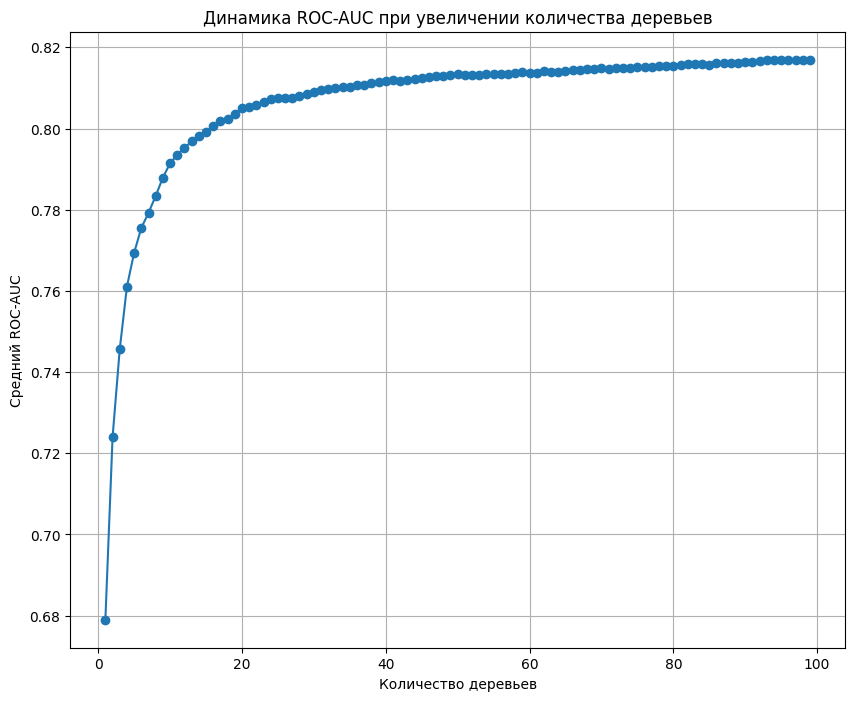

In [452]:
# График, который выводит зависимость между значением ROC-AUC и количеством деревьев в модели

plt.figure(figsize = (10, 8))
plt.plot(grid_treesN, roc_aucN, marker = "o")
plt.xlabel("Количество деревьев")
plt.ylabel("Средний ROC-AUC")
plt.title("Динамика ROC-AUC при увеличении количества деревьев")
plt.grid()
plt.show()

In [453]:
# Будем считать, что качество стабильно, когда изменение ROC-AUC не превышает 0,0001
# Тогда, алгоритм поиска оптимального количества деревьев ниже

optimal_treesN = 0

for i in np.arange(1, len(roc_aucN)):
    if abs(roc_aucN[i] - roc_aucN[i - 1]) <= 0.0001:
        optimal_treesN = grid_treesN[i]
        break

print("Оптимальное количество деревьев в рандомном лесу =", optimal_treesN)
print("Среднее значение AUC-ROC =", sum(roc_aucN)/len(roc_aucN))

Оптимальное количество деревьев в рандомном лесу = 26
Среднее значение AUC-ROC = 0.8064348284888869


#### Подбор оптимального количества деревьев градиентного бустинга, с масштабом

In [454]:
# Поскольку обучение проходит не через кросс валидацию, а с помощью разбиения изначальной выборки
# Имеет смысл увеличить количество деревьев

max_trees_GBN = 500

# Так же, нужно "срастить" тренировочную и валидационную выборки. В данном задании имеет смысл использовать "простое" разбиение
# То есть, разбиение на тренировочную и тестовую выборку 

x_extra_trainN = pd.concat([x_trainN, x_valN])
y_extra_train = np.concatenate((y_train_1d, y_val_1d))

In [455]:
# Нужно создать пустые списки, в которые будут возвращаться значения ошибок на тренировочной и тестовой выборках
# А так же перебрать возможные количества деревьев - подмножества, от 1 до 500 с шагом 1 (499 штук)

grid_trees_GBN = np.arange(1, max_trees_GBN, 1)

train_errorsN = []
test_errorsN = []

In [456]:
# Нужно создать модель и посмотреть на то, какие ошибки она будет возвращать на тренировочной и тестовой выборках
# Исходя из полученных данных, можно будет вывести оптимальное количество деревьев и минимальное значение ошибки, соответственно
# Обучение модели проходит на тренировочной выборке

for n_trees_GBN in grid_trees_GBN:
    modelGB_optimum_treeN = GradientBoostingClassifier(n_estimators = n_trees_GBN, random_state = 42)
    modelGB_optimum_treeN.fit(x_extra_trainN, y_extra_train)
    
# Поиск ошибки для тренировочной выборки    
    y_train_prob_GBN = modelGB_optimum_treeN.predict_proba(x_extra_trainN)
    train_errorN = log_loss(y_extra_train, y_train_prob_GBN)
    train_errorsN.append(train_errorN)

# И для тестовой выборки, соответственно
    y_test_prob_GBN = modelGB_optimum_treeN.predict_proba(x_testN)
    test_errorN = log_loss(y_test, y_test_prob_GBN)
    test_errorsN.append(test_errorN)

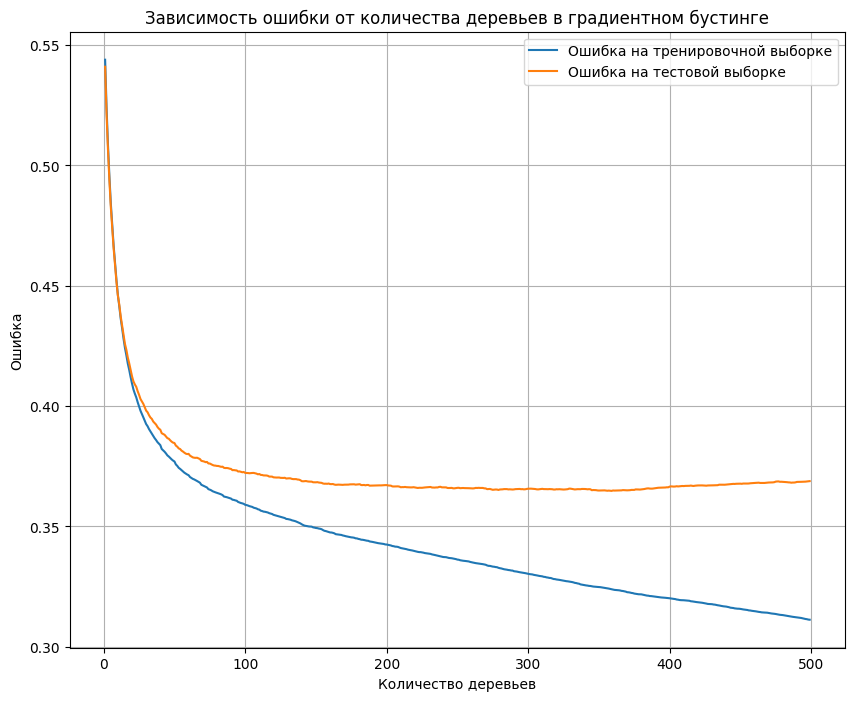

In [457]:
# Построение графика градиентного спуска на тренировочной и тестовой выборках

plt.figure(figsize = (10, 8))
plt.plot(grid_trees_GBN, train_errorsN, label = "Ошибка на тренировочной выборке")
plt.plot(grid_trees_GBN, test_errorsN, label = "Ошибка на тестовой выборке")
plt.xlabel("Количество деревьев")
plt.ylabel("Ошибка")
plt.title("Зависимость ошибки от количества деревьев в градиентном бустинге")
plt.legend()
plt.grid(True)
plt.show()

# Кривая ошибки не совсем U-образна (в явном виде), но имеет тенденцию к росту после падения (на тестовых данных)

In [458]:
# Нахождение оптимального количества деревьев и минимальной ошибки, соответственно

optimal_trees_GBN = grid_trees_GBN[np.argmin(test_errorsN)]
min_val_errorN = min(test_errorsN)

In [459]:
# Итоговые метрики

print("Оптимальное количество деревьев =", optimal_trees_GBN)
print("Минимальная ошибка на тестовой выборке =", min_val_errorN)

Оптимальное количество деревьев = 359
Минимальная ошибка на тестовой выборке = 0.36474163868852566


In [460]:
# Общий вывод:

# Как и ожидалось, масштабирование практически не изменило выходные данные - они буквально не изменились для перебора по сетке
# И совсем немного изменились для поиска деревьев - на одно меньше в рандомном лесу
# В остальном модели показывают совсем незначитальные изменения (далее, чем после пяти знаков после запятой) или же...
# ...вообще отсутствие изменений

#### RandomForest, оптимальная модель, с масштабом

In [461]:
# Построение и обучение модели с найденными параметрами

finalRFN = RandomForestClassifier(n_estimators = 26, max_depth = 9, random_state = 42)
finalRFN.fit(x_extra_trainN, y_extra_train)

RandomForestClassifier(max_depth=9, n_estimators=26, random_state=42)

In [462]:
# Оценка модели на тестовой выборке

y_test_prob_finalRFN = finalRFN.predict_proba(x_testN)[:, 1]  
test_roc_auc_finalRFN = roc_auc_score(y_test, y_test_prob_finalRFN)
print("ROC-AUC на тестовой выборке =", test_roc_auc_finalRFN)

ROC-AUC на тестовой выборке = 0.8488464845229287


#### GradientBoosting, оптимальная модель, с масштабом

In [463]:
# Построение и обучение модели с найденными параметрами

finalGBN = GradientBoostingClassifier(n_estimators = 359, max_depth = 6, random_state = 42)
finalGBN.fit(x_extra_trainN, y_extra_train)

GradientBoostingClassifier(max_depth=6, n_estimators=359, random_state=42)

In [464]:
# Оценка модели на тестовой выборке

y_test_prob_finalGBN = finalGBN.predict_proba(x_testN)[:, 1]  
test_roc_auc_finalGBN = roc_auc_score(y_test, y_test_prob_finalGBN)
print("ROC-AUC на тестовой выборке =", test_roc_auc_finalGBN)

ROC-AUC на тестовой выборке = 0.8487329313663465


# Задание №7/8, 3/1 балла

#### Поиск по сетке, DecisionTree, 2 параметра, масштаб

In [465]:
# Сначала нужно задать значения параметров

param_gridDTCN2 = {"max_depth": np.arange(1, 20, 1), "criterion": ["gini", "entropy"]}

In [466]:
# Создание модели
# Стоит задача разделения на два класса, так что, разумеется, используем классификатор, а не регрессор 
# Поскольку задачу классификации решает не регрессия, а классификация, что логично

modelDTCN2 = DecisionTreeClassifier(random_state = 42)

In [467]:
# Поскольку поиск проходит по двум параметрам, нет смысла плодить циклы
# Так что, можно использовать кросс валидацию

grid_modelDTCN2 = GridSearchCV(estimator = modelDTCN2,
                          param_grid = param_gridDTCN2,
                          cv = 5)

In [468]:
# Запуск перебора по сетке и замер времени

start_time1 = time.time()
grid_modelDTCN2.fit(x_extra_trainN, y_extra_train)
end_time1 = time.time()

In [469]:
# Итоговое временное значение

training_time1 = end_time1 - start_time1
training_time1

14.490195035934448

In [470]:
# Теперь можно посмотреть, какие значения будут лучшими

grid_modelDTCN2.best_params_

# Лучшее значение max_depth = 6, criterion = gini, теперь можно посмотреть, какие результаты даёт такая модель

{'criterion': 'gini', 'max_depth': np.int64(6)}

In [471]:
# На тренировочной выборке

print("Качество модели на тренировочной выборке =", grid_modelDTCN2.best_score_)

Качество модели на тренировочной выборке = 0.8208839236551079


In [472]:
# На тестовой выборке

print("Качество модели на тестовой выборке =", grid_modelDTCN2.score(x_testN, y_test))

Качество модели на тестовой выборке = 0.8267100977198697


#### Поиск по сетке, RandomForest, 2 параметра, масштаб

In [473]:
# Сначала нужно задать значения параметров

param_gridRFN2 = {"criterion": ["gini", "entropy"], "max_features": ["sqrt", "log2", None]}

In [474]:
# Создание модели
# Стоит задача разделения на два класса, так что, разумеется, используем классификатор, а не регрессор 
# Поскольку задачу классификации решает не регрессия, а классификация, что логично
# Подаётся найденной ранее количество древьев при нормализованных данных - 26

modelRFN2 = RandomForestClassifier(random_state = 42, n_estimators = 26, n_jobs = -1)

In [475]:
# Поскольку поиск проходит по двум параметрам, нет смысла плодить циклы
# Так что, можно использовать кросс валидацию

grid_modelRFN2 = GridSearchCV(estimator = modelRFN2,
                          param_grid = param_gridRFN2,
                          cv = 5)

In [476]:
# Запуск перебора по сетке и замер времени

start_time2 = time.time()
grid_modelRFN2.fit(x_extra_trainN, y_extra_train)
end_time2 = time.time()

In [477]:
# Итоговое временное значение

training_time2 = end_time2 - start_time2
training_time2

20.989920616149902

In [478]:
# Теперь можно посмотреть, какие значения будут лучшими

grid_modelRFN2.best_params_

# Лучшее значение max_features = sqrt, criterion = gini, теперь можно посмотреть, какие результаты даёт такая модель

{'criterion': 'gini', 'max_features': 'sqrt'}

In [479]:
# На тренировочной выборке

print("Качество модели на тренировочной выборке =", grid_modelRFN2.best_score_)

Качество модели на тренировочной выборке = 0.8046743666120462


In [480]:
# На тестовой выборке

print("Качество модели на тренировочной выборке =", grid_modelRFN2.score(x_testN, y_test))

Качество модели на тренировочной выборке = 0.7996742671009772


#### Поиск по сетке, GradientBoosting, 2 параметра, масштаб

In [481]:
# Сначала нужно задать значения параметров

param_gridGBN2 = {"criterion": ["friedman_mse", "squared_error"], "max_features": ["sqrt", "log2", None]}

In [482]:
# Создание модели
# Стоит задача разделения на два класса, так что, разумеется, используем классификатор, а не регрессор 
# Поскольку задачу классификации решает не регрессия, а классификация, что логично
# Подаётся найденной ранее количество древьев при нормализованных данных - 359

modelGBN2 = GradientBoostingClassifier(random_state = 42, n_estimators = 359)

In [483]:
# Поскольку поиск проходит по двум параметрам, нет смысла плодить циклы
# Так что, можно использовать кросс валидацию

grid_modelGBN2 = GridSearchCV(estimator = modelGBN2,
                          param_grid = param_gridGBN2,
                          cv = 5)

In [484]:
# Запуск перебора по сетке и замер времени

start_time3 = time.time()
grid_modelGBN2.fit(x_extra_trainN, y_extra_train)
end_time3 = time.time()

In [485]:
# Итоговое временное значение

training_time3 = end_time3 - start_time3
training_time3

115.8018844127655

In [486]:
# Теперь можно посмотреть, какие значения будут лучшими

grid_modelGBN2.best_params_

# Лучшее значение max_features = None, criterion = friedman_mse, теперь можно посмотреть, какие результаты даёт такая модель

{'criterion': 'friedman_mse', 'max_features': None}

In [487]:
# На тренировочной выборке

print("Качество модели на тренировочной выборке =", grid_modelGBN2.best_score_)

Качество модели на тренировочной выборке = 0.8338352561083211


In [488]:
# На тестовой выборке

print("Качество модели на тренировочной выборке =", grid_modelGBN2.score(x_testN, y_test))

Качество модели на тренировочной выборке = 0.8384364820846906


In [489]:
# Общий вывод:

# Поиск по сетке отностельно заданных параметров и имеющегося оптимального количества деревьев помог увеличить качество моделей
# Качество моделей с новыми, подобранными параметрами лучше, чем ранее (во всяком случае, для рандомного леса и градиентного бустинга)
# Однако, качество моделей в целом после масштабирования немного упало
# Данные модели имеет смысл сравнивать только с теми, которые были построены после масштабирования
# И, если учитывать это, то подбор параметров помог увеличить качество модели после масштабирования

# Что касается времени - дольше всего работает градиентный бустинг, но и даёт самое высокое качество модели
# Если леса работают примерно по 20 секунд, то градиентный бустинг работает около двух минут
# Это можно объяснить тем, что в этой модели банально больше деревьев
# А итеративный характер обучения требует много времени, когда в модели много деревьев
# Кроме того, дело в том, что градиент - это долгий метод обучения, использующий в основе нахождение потерь
# Это занимает больше времени, чем другие модели

# Задание №9, 1 балл

#### Перекодировка категориальных признаков, дообработка, финальное сращение

In [490]:
# Сначала нужно создать отдельный набор данных с категориальными переменными

cat_var = data.loc[:, ["workclass", "education", "marital-status", "occupation", "relationship", "race", "sex"]]

In [491]:
# Теперь нужно разбить выборку категориальных переменных
# Поскольку валидационная выборка более не понадобится (далее используем кросс валидацию), то можно разбить как обычно

x_train_cat, x_test_cat = train_test_split(cat_var, test_size = 0.2, random_state = 42)

In [492]:
# С помощью get_dummies нужно разбить категориальные признаки, удалив первый столбец
# Разреженной матрицы бояться не нужно, можно оставить её так, это не будет ошибкой

# Создание и вывод размера поднабора данных с разбитыми категориальными переменными на тренировочной выборке
x_train_catN = pd.get_dummies(x_train_cat, drop_first = True)
print(x_train_catN.shape)

(12277, 50)


In [493]:
# Создание и вывод размера поднабора данных с разбитыми категориальными переменными на тестовой выборке
x_test_catN = pd.get_dummies(x_test_cat, drop_first = True)
print(x_test_catN.shape)

(3070, 48)


In [494]:
# Поскольку было обнаружено, что, из-за невыраженности некоторых значений в данных, на тестовой выборке меньше строк
# Нужно найти те строки, которые есть в тренировочной выборке, но отсутствуют в тестовой
# Ультимативным методом будет просто удалить их, поскольку, если размерность данных на выборках будет разная...
# ...то будет невозможно предсказать значения на тестовой выборке, обучая на тренировочной
# Вот нам и пригодился полный вывод таблицы

# Столбцы для тренировочной выборки
x_train_catN.describe()

,workclass_Local-gov,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,workclass_State-gov,workclass_Without-pay,education_11th,education_12th,education_1st-4th,education_5th-6th,education_7th-8th,education_9th,education_Assoc-acdm,education_Assoc-voc,education_Bachelors,education_Doctorate,education_HS-grad,education_Masters,education_Preschool,education_Prof-school,education_Some-college,marital-status_Married-AF-spouse,marital-status_Married-civ-spouse,marital-status_Married-spouse-absent,marital-status_Never-married,marital-status_Separated,marital-status_Widowed,occupation_Armed-Forces,occupation_Craft-repair,occupation_Exec-managerial,occupation_Farming-fishing,occupation_Handlers-cleaners,occupation_Machine-op-inspct,occupation_Other-service,occupation_Priv-house-serv,occupation_Prof-specialty,occupation_Protective-serv,occupation_Sales,occupation_Tech-support,occupation_Transport-moving,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Asian-Pac-Islander,race_Black,race_Other,race_White,sex_Male
count,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277
unique,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
top,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True
freq,11394,9007,11828,11199,11774,12274,11873,12124,12222,12154,12054,12093,11876,11730,10199,12124,8328,11588,12255,12039,9534,12267,6475,12130,8365,11878,11941,12274,10633,10643,11889,11738,11466,10977,12203,10601,12007,10809,11906,11639,9155,11915,10472,11012,11666,11873,11131,12189,10521,8331


In [495]:
# Столбцы для тестовой выборки

x_train_catN.describe()

,workclass_Local-gov,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,workclass_State-gov,workclass_Without-pay,education_11th,education_12th,education_1st-4th,education_5th-6th,education_7th-8th,education_9th,education_Assoc-acdm,education_Assoc-voc,education_Bachelors,education_Doctorate,education_HS-grad,education_Masters,education_Preschool,education_Prof-school,education_Some-college,marital-status_Married-AF-spouse,marital-status_Married-civ-spouse,marital-status_Married-spouse-absent,marital-status_Never-married,marital-status_Separated,marital-status_Widowed,occupation_Armed-Forces,occupation_Craft-repair,occupation_Exec-managerial,occupation_Farming-fishing,occupation_Handlers-cleaners,occupation_Machine-op-inspct,occupation_Other-service,occupation_Priv-house-serv,occupation_Prof-specialty,occupation_Protective-serv,occupation_Sales,occupation_Tech-support,occupation_Transport-moving,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Asian-Pac-Islander,race_Black,race_Other,race_White,sex_Male
count,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277,12277
unique,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
top,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True
freq,11394,9007,11828,11199,11774,12274,11873,12124,12222,12154,12054,12093,11876,11730,10199,12124,8328,11588,12255,12039,9534,12267,6475,12130,8365,11878,11941,12274,10633,10643,11889,11738,11466,10977,12203,10601,12007,10809,11906,11639,9155,11915,10472,11012,11666,11873,11131,12189,10521,8331


In [496]:
# Методом зоркого глаза обнаружено, что на тестовой выборке отсутсвуют столбцы:
# "marital-status_Married-AF-spouse" и "occupation_Armed-Forces"
# Теперь можно удалить их из тренировочной выборки

x_train_catN = x_train_catN.drop(["marital-status_Married-AF-spouse", "occupation_Armed-Forces"], axis = 1)

In [497]:
# Объединение наборов данных: нормализованного категориального и нормализованного вещственного для тренировочной выборки
# Должно быть 6 + 8 = 54 после удаления "лишних" столбцов из тренировочной выборки  

x_trainF = np.concatenate([x_extra_trainN, x_train_catN], axis = 1)
x_trainF.shape

(12277, 54)

In [498]:
# Объединение наборов данных: нормализованного категориального и нормализованного вещственного для тестовоой выборки

x_testF = np.concatenate([x_testN, x_test_catN], axis = 1)
x_testF.shape

# Количество столбцов для тренировочной и тестовой выборки равное!

(3070, 54)

# Задание №10, 1 балл

#### Поиск по сетке, DecisionTree, финальная модель

In [499]:
# Сначала нужно задать значения параметров

param_gridDTCF = {"max_depth": np.arange(1, 20, 1), "criterion": ["gini", "entropy"]}

In [500]:
# Создание модели
# Стоит задача разделения на два класса, так что, разумеется, используем классификатор, а не регрессор 
# Поскольку задачу классификации решает не регрессия, а классификация, что логично

modelDTCF = DecisionTreeClassifier(random_state = 42)

In [501]:
# Поскольку поиск проходит по двум параметрам, нет смысла плодить циклы
# Так что, можно использовать кросс валидацию

grid_modelDTCF = GridSearchCV(estimator = modelDTCF,
                          param_grid = param_gridDTCF,
                          cv = 5)

In [502]:
# Запуск перебора по сетке и замер времени

start_time4 = time.time()
grid_modelDTCF.fit(x_trainF, y_extra_train)
end_time4 = time.time()

In [503]:
# Итоговое временное значение

training_time4 = end_time4 - start_time4
training_time4

20.30691647529602

In [504]:
# Теперь можно посмотреть, какие значения будут лучшими

grid_modelDTCF.best_params_

# Лучшее значение max_depth = 5, criterion = gini, теперь можно посмотреть, какие результаты даёт такая модель

{'criterion': 'gini', 'max_depth': np.int64(5)}

In [505]:
# На тренировочной выборке

print("Качество модели на тренировочной выборке =", grid_modelDTCF.best_score_)

Качество модели на тренировочной выборке = 0.8198250595407897


In [506]:
# На тестовой выборке

print("Качество модели на тестовой выборке =", grid_modelDTCF.score(x_testF, y_test))

Качество модели на тестовой выборке = 0.8250814332247557


#### Поиск по сетке, RandomForest, финальная модель

In [507]:
# Сначала нужно задать значения параметров

param_gridRFF = {"criterion": ["gini", "entropy"], "max_features": ["sqrt", "log2", None]}

In [508]:
# Создание модели
# Стоит задача разделения на два класса, так что, разумеется, используем классификатор, а не регрессор 
# Поскольку задачу классификации решает не регрессия, а классификация, что логично
# Подаётся найденной ранее количество древьев при нормализованных данных - 26

modelRFF = RandomForestClassifier(random_state = 42, n_estimators = 26, n_jobs = -1)

In [509]:
# Поскольку поиск проходит по двум параметрам, нет смысла плодить циклы
# Так что, можно использовать кросс валидацию

grid_modelRFF = GridSearchCV(estimator = modelRFF,
                          param_grid = param_gridRFF,
                          cv = 5)

In [510]:
# Запуск перебора по сетке и замер времени

start_time5 = time.time()
grid_modelRFF.fit(x_trainF, y_extra_train)
end_time5 = time.time()

In [511]:
# Итоговое временное значение

training_time5 = end_time5 - start_time5
training_time5

22.51745295524597

In [512]:
# Теперь можно посмотреть, какие значения будут лучшими

grid_modelRFF.best_params_

# Лучшее значение max_features = None, criterion = entropy, теперь можно посмотреть, какие результаты даёт такая модель

{'criterion': 'entropy', 'max_features': None}

In [513]:
# На тренировочной выборке

print("Качество модели на тренировочной выборке =", grid_modelRFF.best_score_)

Качество модели на тренировочной выборке = 0.8157515075926944


In [514]:
# На тестовой выборке

print("Качество модели на тренировочной выборке =", grid_modelRFF.score(x_testF, y_test))

Качество модели на тренировочной выборке = 0.8198697068403908


#### Поиск по сетке, GradientBoosting, финальная модель

In [515]:
# Сначала нужно задать значения параметров

param_gridGBF = {"criterion": ["friedman_mse", "squared_error"], "max_features": ["sqrt", "log2", None]}

In [516]:
# Создание модели
# Стоит задача разделения на два класса, так что, разумеется, используем классификатор, а не регрессор 
# Поскольку задачу классификации решает не регрессия, а классификация, что логично
# Подаётся найденной ранее количество древьев при нормализованных данных - 359

modelGBF = GradientBoostingClassifier(random_state = 42, n_estimators = 359)

In [517]:
# Поскольку поиск проходит по двум параметрам, нет смысла плодить циклы
# Так что, можно использовать кросс валидацию

grid_modelGBF = GridSearchCV(estimator = modelGBF,
                          param_grid = param_gridGBF,
                          cv = 5)

In [518]:
# Запуск перебора по сетке и замер времени

start_time6 = time.time()
grid_modelGBF.fit(x_trainF, y_extra_train)
end_time6 = time.time()

In [519]:
# Итоговое временное значение

training_time6 = end_time6 - start_time6
training_time6

174.89722418785095

In [520]:
# Теперь можно посмотреть, какие значения будут лучшими

grid_modelGBF.best_params_

# Лучшее значение max_features = None, criterion = friedman_mse, теперь можно посмотреть, какие результаты даёт такая модель

{'criterion': 'friedman_mse', 'max_features': None}

In [521]:
# На тренировочной выборке

print("Качество модели на тренировочной выборке =", grid_modelGBF.best_score_)

Качество модели на тренировочной выборке = 0.8315542965562536


In [522]:
# На тестовой выборке

print("Качество модели на тренировочной выборке =", grid_modelGBF.score(x_testF, y_test))

Качество модели на тренировочной выборке = 0.8364820846905537


In [523]:
# Общий вывод:

# Модели деревьев и градинетного бустинга немного поменяли свои значения в меньшую сторону
# Модель рандомного леса стала работать лучше
# Модель градиентного бустинга всё ещё остаётся самой ресурснозатратной и возвращает при этом самый лучший результат
# Финальная лучшая модель - это модель градиентного бустинга. Учёт всех переменных из набора данных возвращает точность 83,64%
# Есть показатели и выше, но эти показатели не столь репрезентативны, потому что включют в себя не все переменные модели

# Милые фотокарточки!

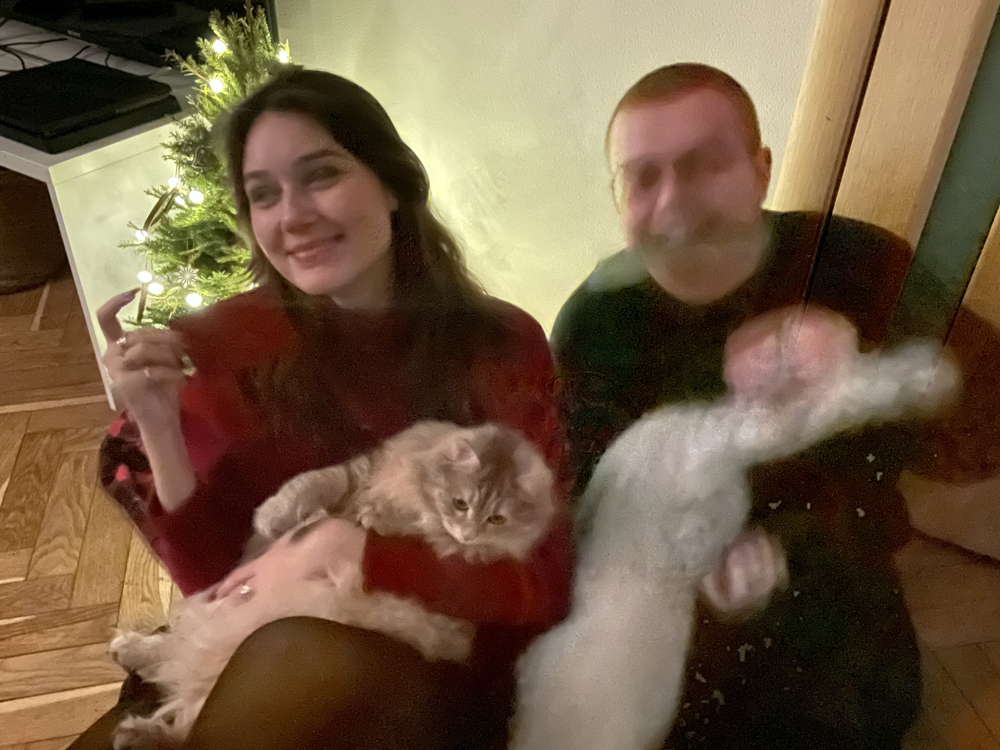

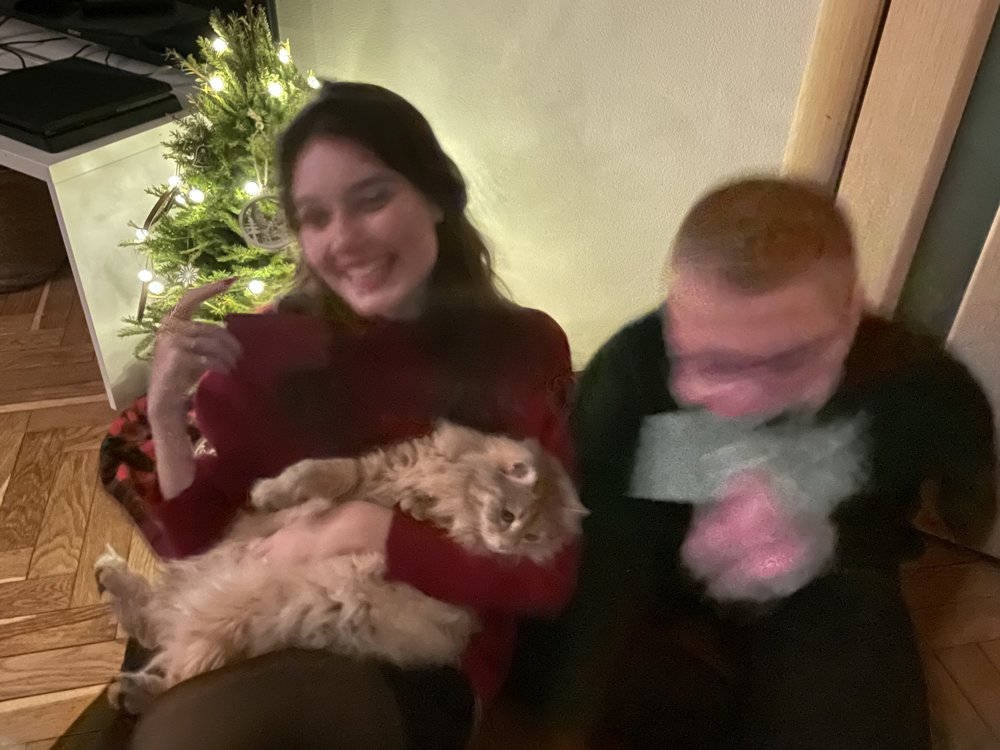

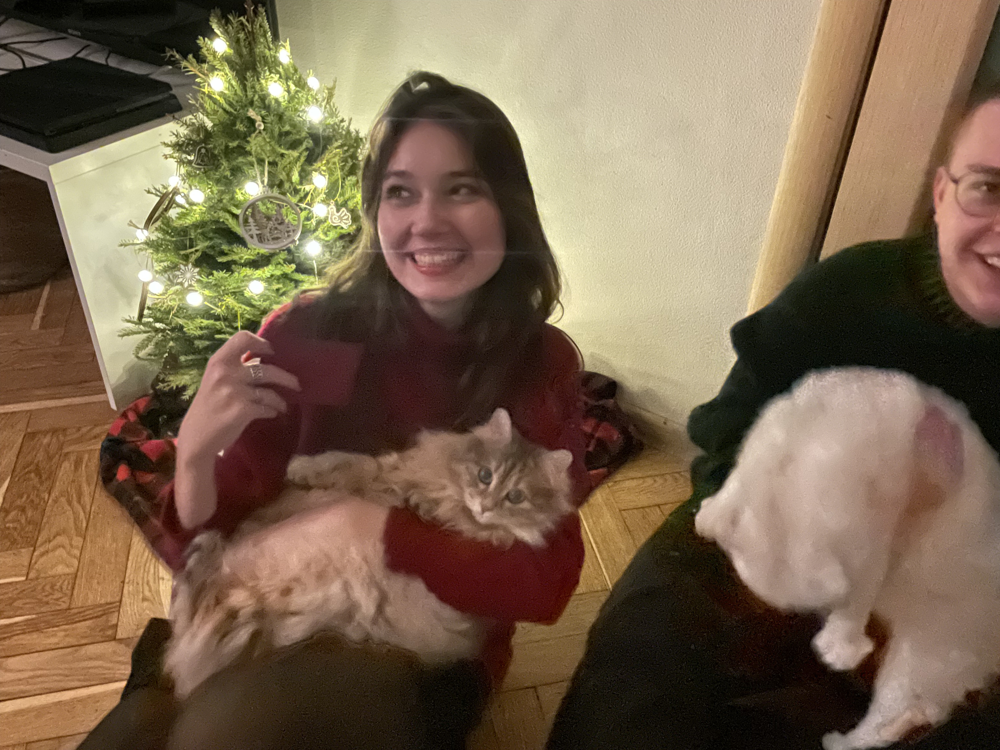

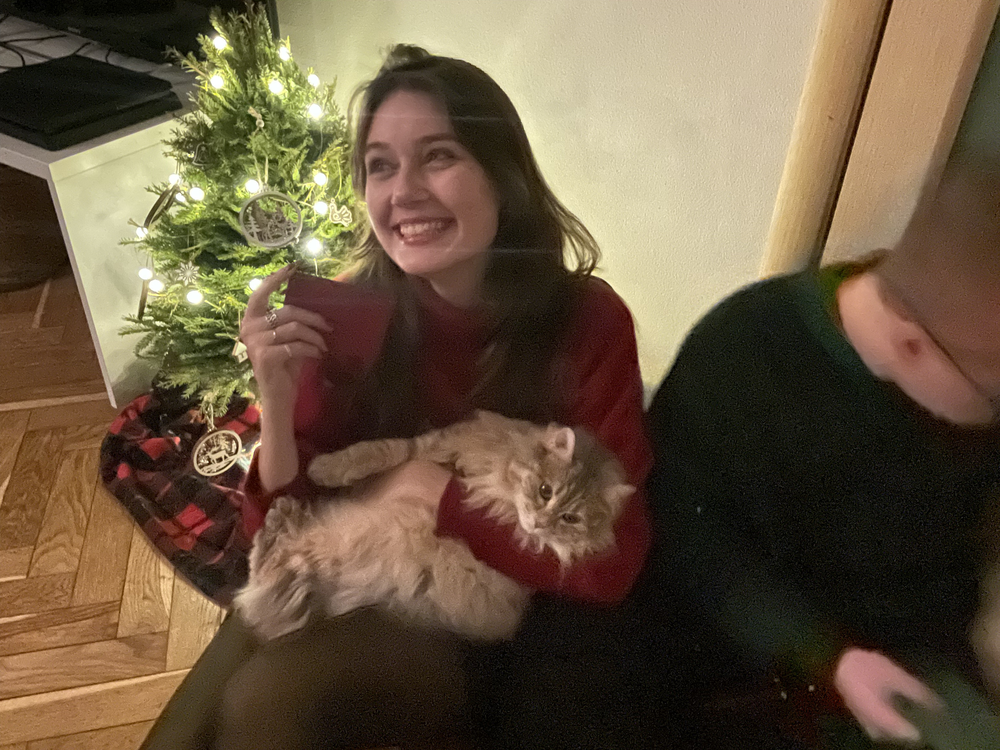

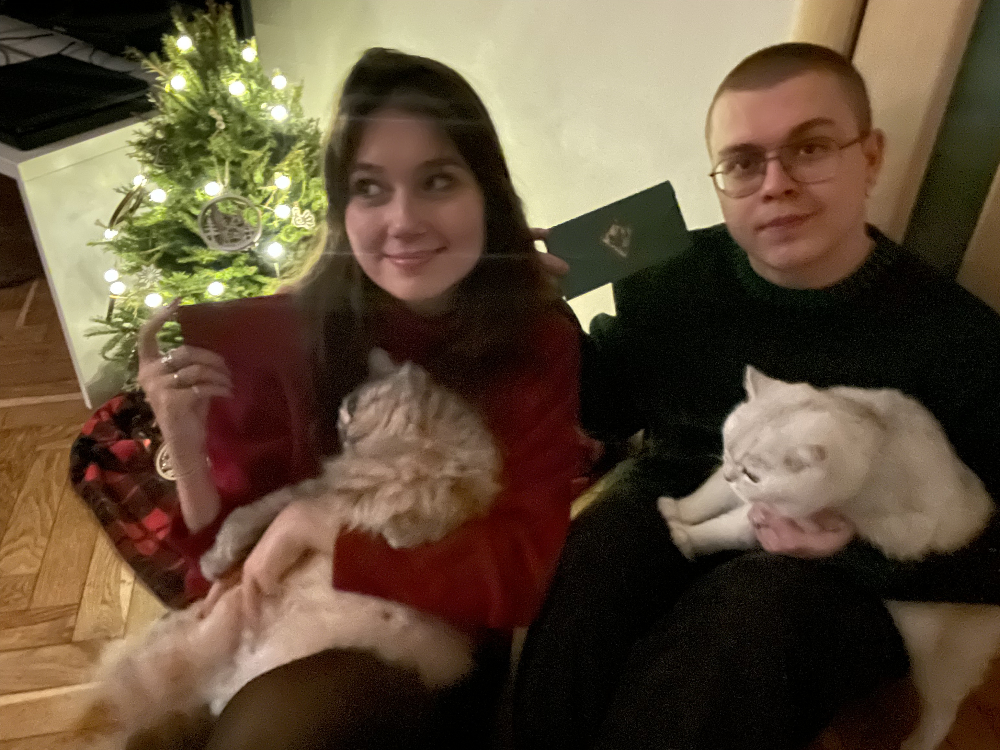